In [ ]:
import numpy as np
import pandas as pd
import tensorflow as tf
import cv2, os, random, math
import matplotlib.pyplot as plt
from tensorflow.keras.layers import Conv2D, Input, Flatten, Dense, MaxPooling2D, Softmax, ReLU, BatchNormalization, Dropout, Reshape, Softmax, GlobalAveragePooling2D
from tensorflow.keras.models import Model
from sklearn.model_selection import train_test_split
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, LearningRateScheduler
import matplotlib.patches as patches
from tensorflow.keras.regularizers import l2

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

!unzip '/content/drive/MyDrive/archive (1).zip' -d /content/drive/MyDrive/bone

In [ ]:
!cp -r /content/drive/MyDrive/bone /content/

In [ ]:
TARGET_SIZE = 640
BATCH_SIZE = 16
MAX_BOX_COUNT = 1
CLASS_SIZE = 10
CHANNELS = 3

In [ ]:
class DataProcessor():
  def __init__(self, image_path, boxes = [], target_size = TARGET_SIZE):
    self.target_w = target_size
    self.target_h = target_size
    self.image_path = image_path
    self.boxes = np.array(boxes)
    self.padded_boxes = None
    if image_path is not None:
      if CHANNELS == 3:
        self.image = cv2.imread(image_path)
        self.image = cv2.cvtColor(self.image, cv2.COLOR_BGR2RGB)
        self.org_h, self.org_w, _ = self.image.shape
      else:
        self.image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
        self.org_h, self.org_w = self.image.shape

      if np.any(self.boxes):
        self.boxes[:, [0, 2]] = self.boxes[:, [0, 2]] * self.org_w
        self.boxes[:, [1, 3]] = self.boxes[:, [1, 3]] * self.org_h
        self.boxes = [self.convert_wh_xy(box) for box in self.boxes]
    else:
      self.image = None
      self.org_h = None
      self.org_w = None
    self.padded_ratio = None
    self.padded_new_w = None
    self.padded_new_h = None
    self.pad_w = 0
    self.pad_h = 0

  def resize_with_padding(self, augment=True):
    ratio = min(self.target_w/self.org_w, self.target_h/self.org_h)
    new_w = int(self.org_w * ratio)
    new_h = int(self.org_h * ratio)
    new_image = cv2.resize(self.image, (new_w, new_h))
    padded_image = np.zeros(shape=(self.target_w, self.target_h, CHANNELS), dtype=np.float32)
    pad_w = (self.target_w - new_w)//2
    pad_h = (self.target_h - new_h)//2
    padded_image[pad_h:(new_h+pad_h), pad_w:(new_w+pad_w)] = new_image

    self.padded_ratio = ratio
    self.padded_new_w = new_w
    self.padded_new_h = new_h
    self.pad_w = pad_w
    self.pad_h = pad_h

    if self.boxes:
      self.padded_boxes = self.calculate_padded_boxes()
      if augment:
        padded_image, augmented_boxes = self.augment_image(padded_image, self.padded_boxes)
        self.padded_boxes = np.array(augmented_boxes)
    else:
      self.padded_boxes = np.zeros(shape=(1,4), dtype=np.float32)

    return padded_image, np.array(self.padded_boxes)

  def augment_image(self, image, boxes):
    augment = random.choices(['o', 'flip_h', 'flip_v', 'r90', 'r180', 'r270'], [0.3, 0.15, 0.15, 0.15, 0.15, 0.1], k=1)[0]
    org_boxes = boxes
    boxes = np.array([self.convert_xy_wh(box) for box in boxes])
    boxes /= self.target_w
    new_boxes = boxes

    xmin = org_boxes[:, 0] - self.pad_w
    ymin = org_boxes[:, 1] - self.pad_h
    xmax = org_boxes[:, 2] - self.pad_w
    ymax = org_boxes[:, 3] - self.pad_h

    if augment == 'o':
      return image, org_boxes
    elif augment == 'flip_h':
      image = cv2.flip(image, 1)
      new_boxes[:, 0] = 1 - boxes[:, 0]
    elif augment == 'flip_v':
      image = cv2.flip(image, 0)
      new_boxes[:, 1] = 1 - boxes[:, 1]
    elif augment == 'r90':
      image = cv2.rotate(image, cv2.ROTATE_90_CLOCKWISE)
      new_xmin = self.padded_new_h - ymax - 1
      new_ymin = xmin
      new_xmax = self.padded_new_h - ymin - 1
      new_ymax = xmax
      new_pad_w, new_pad_h = self.pad_h, self.pad_w
      new_target_w, new_target_h = self.target_h, self.target_w
    elif augment == 'r180':
      image = cv2.rotate(image, cv2.ROTATE_180)
      new_boxes[:, 0] = 1 - boxes[:, 0]
      new_boxes[:, 1] = 1 - boxes[:, 1]
    elif augment == 'r270':
      image = cv2.rotate(image, cv2.ROTATE_90_COUNTERCLOCKWISE)
      new_xmin = ymin
      new_ymin = self.padded_new_w - xmax - 1
      new_xmax = ymax
      new_ymax = self.padded_new_w - xmin - 1
      new_pad_w, new_pad_h = self.pad_h, self.pad_w
      new_target_w, new_target_h = self.target_h, self.target_w

    if augment == 'r90' or augment == 'r270':
      new_xmin += new_pad_w
      new_ymin += new_pad_h
      new_xmax += new_pad_w
      new_ymax += new_pad_h
      new_boxes = np.stack([new_xmin, new_ymin, new_xmax, new_ymax], axis=1)
    else:
      new_boxes *= self.target_w
      new_boxes = [self.convert_wh_xy(box) for box in new_boxes]

    return image, new_boxes

  def calculate_padded_boxes(self):
    box_pixels = np.array(self.boxes.copy())
    box_pixels[:, 0] = box_pixels[:, 0] * self.padded_ratio + self.pad_w
    box_pixels[:, 1] = box_pixels[:, 1] * self.padded_ratio + self.pad_h
    box_pixels[:, 2] = box_pixels[:, 2] * self.padded_ratio + self.pad_w
    box_pixels[:, 3] = box_pixels[:, 3] * self.padded_ratio + self.pad_h
    return box_pixels

  def convert_wh_xy(self, box):
    xc, yc, ww, hh = box
    x1 = (xc - ww/2)
    y1 = (yc - hh/2)
    x2 = (xc + ww/2)
    y2 = (yc + hh/2)
    return np.array([x1, y1, x2, y2])

  def convert_xy_wh(self, box):
    x1, y1, x2, y2 = box
    xc = (x1+x2)/2
    yc = (y1+y2)/2
    ww = (x2-x1)
    hh = (y2-y1)
    return np.array([xc, yc, ww,hh])

In [ ]:
class DataGenerator():
  def __init__(self, target_size = TARGET_SIZE, class_size = CLASS_SIZE):
    self.target_size = target_size
    self.class_size = class_size
    self.train_images = None
    self.test_images = None
    self.max_box_count = 0

  def build_train_test_data(self, image_dir, label_dir, type_ = None):
    global MAX_BOX_COUNT
    image_paths = []
    for path in os.listdir(image_dir):
      if '.jpg' in path or '.png' in path:
        img_path = os.path.join(image_dir, path)
        label_path = path.replace('.jpg', '.txt').replace('.png', '.txt').replace('.jpeg', '.txt')
        label_path = os.path.join(label_dir, label_path)
        if os.path.exists(label_path):
          try:
            labels = pd.read_csv(label_path, sep='\s+', header=None)
          except Exception as e:
            continue
          box_count = len(labels)
          if box_count == 0:
            continue
          image_paths.append([img_path, label_path])
          if box_count > self.max_box_count:
            self.max_box_count = box_count

    print(f'Total images: {len(image_paths)}')
    print(f'Max box count: {self.max_box_count}')
    if MAX_BOX_COUNT == None:
      print(f'Setting max box count to {self.max_box_count}')
      MAX_BOX_COUNT = self.max_box_count
    else:
      print(f'Setting max box count to {MAX_BOX_COUNT} by global rule')
      self.max_box_count = MAX_BOX_COUNT

    if(type_ == None):
      train_images, test_images = train_test_split(image_paths, test_size=0.2, random_state=22)
      print(f'Train images: {len(train_images)}')
      print(f'Test images: {len(test_images)}')
      self.train_images = np.random.permutation(np.array(train_images))
      self.test_images = np.random.permutation(np.array(test_images))
    elif type_ == 'train':
      self.train_images = np.random.permutation(np.array(image_paths))
      print(f'Train images: {len(self.train_images)}')
    else:
      self.test_images = np.random.permutation(np.array(image_paths))
      print(f'Test images: {len(self.test_images)}')

  def generate_dataset(self, type_):
    if type_ == 'train':
      dataset = self.train_images
    else:
      dataset = self.test_images

    pad_max_box_count = self.max_box_count

    for img_path, label_path in dataset:
      labels = pd.read_csv(label_path, sep='\s+', header=None)

      x_centers = labels.iloc[:, 1].values
      widths = labels.iloc[:, 3].values
      xmin = x_centers - widths / 2.0
      order = np.argsort(xmin)
      labels = labels.iloc[order].reset_index(drop=True)

      boxes = labels.iloc[:, 1:].values.astype(np.float32)
      classes = labels.iloc[:, 0].values.astype(np.int32)

      data_processor = DataProcessor(img_path, boxes)
      image, new_boxes = data_processor.resize_with_padding(False)

      new_boxes = np.array([data_processor.convert_xy_wh(box) for box in new_boxes])
      new_boxes = new_boxes/self.target_size

      classes_oh = tf.one_hot(classes, depth=self.class_size, dtype=tf.float32).numpy()
      min_pad = min(len(classes_oh), self.max_box_count)
      padded_classes = np.zeros((pad_max_box_count, self.class_size), dtype=np.float32)
      padded_classes[:min_pad] = classes_oh[:min_pad]

      min_pad = min(len(new_boxes), self.max_box_count)
      padded_boxes = np.zeros((pad_max_box_count, 4), dtype=np.float32)
      padded_boxes[:min_pad] = new_boxes[:min_pad]

      objectness = np.full(shape=(pad_max_box_count,), fill_value= -1)
      objectness[:min_pad] = 1
      #objectness = objectness.reshape(-1,1)

      #sequence = np.concatenate((padded_boxes, objectness, padded_classes), axis=1)
      #sequence = sequence.reshape(-1)

      #print('boxes:', padded_boxes)
      #print('class:', padded_classes)
      #print('path:', img_path)
      #show_image_with_boxes(image/255, padded_boxes, padded_classes)

      yield image/255.0, (padded_boxes, padded_classes)


In [ ]:
class ModelGenerator():
  def __init__(self, input_size = TARGET_SIZE, class_size = CLASS_SIZE, batch_size = BATCH_SIZE, max_box_count = MAX_BOX_COUNT):
    self.input_size = input_size
    self.class_size = class_size
    self.batch_size = batch_size
    self.max_box_count = max_box_count
    self.train_dataset = None
    self.test_dataset = None
    self.total_num_train_images = None
    self.total_num_test_images = None
    self.model = None

  def build_conv_layer(self, x, filters, input_shape=None):
    x = Conv2D(filters=filters, kernel_size=3, padding='same', use_bias=False, kernel_regularizer=l2(1e-4))(x)
    x = BatchNormalization()(x)
    x = ReLU()(x)
    #x = tf.keras.layers.Dropout(0.2)(x)

    if filters in [64, 256, 1024]:
      x = MaxPooling2D(pool_size=2, strides=2)(x)
    return x

  def build_neural_network(self, x):
      x = Dense(units=512, activation='relu')(x)
      x = BatchNormalization()(x)
      x = Dropout(0.3)(x)  # Increase dropout

      x = Dense(units=256, activation='relu')(x)
      x = BatchNormalization()(x)
      x = Dropout(0.3)(x)

      x = Dense(units=128, activation='relu')(x)
      x = BatchNormalization()(x)
      x = Dropout(0.2)(x)
      return x

  def build_model(self):
    if self.test_dataset == None:
      raise RuntimeError('Run build_dataset() before building model')

    input_layer = Input(shape=(self.input_size, self.input_size, CHANNELS,))
    x = self.build_conv_layer(input_layer, 32)
    x = self.build_conv_layer(x, 64)
    x = self.build_conv_layer(x, 128)
    x = self.build_conv_layer(x, 256)
    x = self.build_conv_layer(x, 512)
    x = self.build_conv_layer(x, 1024)
    x = GlobalAveragePooling2D()(x)
    x = self.build_neural_network(x)

    box_outputs = Dense(units= self.max_box_count * 4)(x)
    box_outputs = Reshape(target_shape=(self.max_box_count, 4), name='box')(box_outputs)

    class_outputs = Dense(units= self.max_box_count * self.class_size, activation=None)(x)
    class_outputs = Reshape(target_shape=(self.max_box_count, self.class_size))(class_outputs)
    class_outputs = Softmax(axis=-1, name='class')(class_outputs)

    self.model = Model(inputs=input_layer, outputs=[box_outputs, class_outputs])

    return self.model

  def build_dataset(self, image_path, label_path, split = False, test_image_path = None, test_label_path = None):
    data_generator = DataGenerator()
    if split:
      data_generator.build_train_test_data(image_path, label_path)
    else:
      data_generator.build_train_test_data(image_path, label_path, 'train')
      data_generator.build_train_test_data(test_image_path, test_label_path, 'test')

    self.total_num_train_images = len(data_generator.train_images)
    self.total_num_test_images = len(data_generator.test_images)

    self.train_dataset = tf.data.Dataset.from_generator(
        generator=lambda: data_generator.generate_dataset('train'),
        output_signature=(
            tf.TensorSpec(shape=(self.input_size, self.input_size, CHANNELS), dtype=tf.float32),
            (
              tf.TensorSpec(shape=(self.max_box_count, 4), dtype=tf.float32),
              tf.TensorSpec(shape=(self.max_box_count, self.class_size), dtype=tf.float32)
            )
        )
    ).batch(self.batch_size).shuffle(1024, reshuffle_each_iteration=True).prefetch(tf.data.AUTOTUNE).repeat()

    self.test_dataset = tf.data.Dataset.from_generator(
        generator=lambda: data_generator.generate_dataset('test'),
        output_signature=(
            tf.TensorSpec(shape=(self.input_size, self.input_size, CHANNELS), dtype=tf.float32),
            (
              tf.TensorSpec(shape=(self.max_box_count, 4), dtype=tf.float32),
              tf.TensorSpec(shape=(self.max_box_count, self.class_size), dtype=tf.float32)
            )
        )
    ).batch(self.batch_size).prefetch(tf.data.AUTOTUNE).repeat()

  def train(self, epochs = 25):
    num_epochs = self.total_num_train_images // self.batch_size
    num_validation_steps = self.total_num_test_images // self.batch_size
    loss_obj = LossCalculator(max_box_count=MAX_BOX_COUNT)

    initial_lr = 0.005
    lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(
        initial_lr,
        decay_steps=500,  # Decay every 500 steps
        decay_rate=0.9,   # Reduce by 10% each time
        staircase=True
    )
    optimizer = tf.keras.optimizers.Adam(learning_rate=lr_schedule)

    steps_per_epoch = self.total_num_train_images//self.batch_size
    validation_step = self.total_num_test_images//self.batch_size
    metrics = {'box': 'mse', 'class': 'accuracy'}
    loss_func = {'box': loss_obj.mse_box_loss, 'class': loss_obj.class_loss}
    #loss_func = {'box': loss_obj.huber_box_loss, 'class': loss_obj.focal_class_loss}
    loss_weights = {'box': 2, 'class': 1}

    earlyStops = EarlyStopping(
        monitor = 'val_loss',
        patience = 8,
        restore_best_weights=True,
        verbose = 1
    )
    '''
    lrReduce = ReduceLROnPlateau(
        monitor = 'val_loss',
        patience = 4,
        factor = 0.7,
        min_lr = 1e-6,
        verbose=1
    )
    '''
    tf.keras.mixed_precision.set_global_policy('mixed_float16')
    print('Compiling model...')
    self.model.compile(optimizer= optimizer, loss = loss_func, loss_weights = loss_weights, metrics = metrics)
    with tf.device('/GPU:0'):
      print('Training model...')
      self.model.fit(
          x=self.train_dataset,
          validation_data=self.test_dataset,
          steps_per_epoch= steps_per_epoch,
          validation_steps = validation_step,
          epochs=epochs,
          callbacks=[earlyStops]
        )

  def save_model(self, path_with_name):
    self.model.save(path_with_name)

  def load_model(self, path):
    loss_obj = LossCalculator(self.class_size)
    self.model = tf.keras.models.load_model(
        path,
        custom_objects={
            "mse_box_loss": loss_obj.mse_box_loss,
            "class_loss": loss_obj.class_loss
        }
    )
    return self.model

In [ ]:
class LossCalculator:

    def __init__(self, class_size=CLASS_SIZE, max_box_count=MAX_BOX_COUNT):
        self.class_size = class_size
        self.max_box_count = max_box_count
        self.delta = 0.5  # Huber delta
        self.gamma = 1.5  # Focal loss gamma
        self.alpha = 0.5  # Focal loss alpha

    def mse_box_loss(self, y_true, y_pred):
        y_true = tf.reshape(y_true, shape=(-1, self.max_box_count, 4))
        y_pred = tf.reshape(y_pred, shape=(-1, self.max_box_count, 4))

        # Mask: True for real boxes
        mask = tf.reduce_any(tf.not_equal(y_true, 0.0), axis=-1)  # (batch, max_box_count)
        mask = tf.cast(mask, tf.float32)
        mask = tf.expand_dims(mask, axis=-1)  # (batch, max_box_count, 1)

        diff = tf.square(y_true - y_pred) * mask
        total_loss = tf.reduce_sum(diff)
        total_boxes = tf.reduce_sum(mask)

        return tf.math.divide_no_nan(total_loss, total_boxes)  # Safe divide

    def class_loss(self, y_true, y_pred):
        y_true = tf.reshape(y_true, shape=(-1, self.max_box_count, self.class_size))
        y_pred = tf.reshape(y_pred, shape=(-1, self.max_box_count, self.class_size))

        mask = tf.reduce_any(tf.not_equal(y_true, 0), axis=-1)  # (batch, max_box_count)
        mask = tf.cast(mask, tf.float32)
        mask = tf.expand_dims(mask, axis=-1)  # (batch, max_box_count, 1)

        ce = tf.keras.losses.categorical_crossentropy(y_true, y_pred)  # (batch, max_box_count)
        ce = ce * tf.squeeze(mask, axis=-1)

        total_loss = tf.reduce_sum(ce)
        total_boxes = tf.reduce_sum(mask)

        return tf.math.divide_no_nan(total_loss, total_boxes)

    # --- Smooth L1 / Huber loss for boxes ---
    def huber_box_loss(self, y_true, y_pred):
        y_true = tf.reshape(y_true, (-1, self.max_box_count, 4))
        y_pred = tf.reshape(y_pred, (-1, self.max_box_count, 4))

        # Mask for real boxes
        mask = tf.reduce_any(tf.not_equal(y_true, 0.0), axis=-1)  # (batch, max_box_count)
        mask = tf.cast(mask, tf.float32)
        mask = tf.expand_dims(mask, axis=-1)

        diff = tf.abs(y_true - y_pred)
        huber = tf.where(diff < self.delta, 0.5 * tf.square(diff), self.delta * (diff - 0.5 * self.delta))
        huber = huber * mask

        total_loss = tf.reduce_sum(huber)
        total_boxes = tf.reduce_sum(mask)

        return tf.math.divide_no_nan(total_loss, total_boxes)

    # --- Focal loss for classification ---
    def focal_class_loss(self, y_true, y_pred):
        y_true = tf.reshape(y_true, (-1, self.max_box_count, self.class_size))
        y_pred = tf.reshape(y_pred, (-1, self.max_box_count, self.class_size))

        # Mask for real boxes
        mask = tf.reduce_any(tf.not_equal(y_true, 0), axis=-1)  # (batch, max_box_count)
        mask = tf.cast(mask, tf.float32)
        mask = tf.expand_dims(mask, axis=-1)

        # Clip predictions for numerical stability
        y_pred = tf.clip_by_value(y_pred, 1e-7, 1.0 - 1e-7)

        ce = -y_true * tf.math.log(y_pred)
        pt = tf.reduce_sum(y_true * y_pred, axis=-1, keepdims=True)
        focal_weight = self.alpha * tf.pow(1 - pt, self.gamma)
        focal = ce * focal_weight

        focal = tf.reduce_sum(focal, axis=-1, keepdims=True) * mask
        total_loss = tf.reduce_sum(focal)
        total_boxes = tf.reduce_sum(mask)

        return tf.math.divide_no_nan(total_loss, total_boxes)


In [ ]:
class PredictUtils():
    def __init__(self, class_names=None):
        self.class_names = class_names  # list of class names

    def predict(self, model, image_paths, label_paths=None):
        batch = []
        for image_path in image_paths:
            # Use DataProcessor for padding/resizing
            dp = DataProcessor(image_path)
            img, _ = dp.resize_with_padding(False)
            batch.append(img / 255.0)

        # Stack into one batch
        batch_np = np.stack(batch, axis=0)
        predictions = model.predict(batch_np)

        boxes = predictions[0]
        preds = predictions[1]

        # Initialize lists
        classes, class_probs = [], []

        # Parse predictions
        for probs in preds:
            classes_ = np.argmax(probs, axis=1)
            class_probs_ = np.max(probs, axis=1)

            #print('box',boxes_)
            #print('class',classes_)
            #print('prob',class_probs_)

            #boxes.append(boxes_)
            classes.append(classes_)
            class_probs.append(class_probs_)

        # Load original boxes and classes if labels provided
        org_boxes, org_classes = [], []
        if label_paths is not None:
            for label_path in label_paths:
                labels = pd.read_csv(label_path, sep='\s+', header=None)
                org_boxes.append(np.array(labels.iloc[:, 1:5].values))
                org_classes.append(np.array(labels.iloc[:, 0].values))

        # Display images with predicted and original boxes
        self.display_images_with_boxes(batch, boxes, org_boxes, org_classes, classes, class_probs)

    def display_images_with_boxes(self, images, boxes=[], org_boxes=[], org_class_ids=[], classes_ids=[], class_probs=[]):
        n = len(images)
        cols = 2
        rows = math.ceil(n / cols)

        fig, axes = plt.subplots(rows, cols, figsize=(18, rows * 7))
        axes = axes.flat if rows * cols > 1 else [axes]

        for i, image in enumerate(images):
            axes[i].imshow(image)
            axes[i].axis('off')
            H, W = image.shape[:2]

            # Predicted boxes
            if len(boxes):
                for j, box in enumerate(boxes[i]):
                    class_id = classes_ids[i][j] if classes_ids else None
                    prob = class_probs[i][j] if class_probs else None
                    class_name = self.class_names[class_id] if (class_id is not None and self.class_names) else None
                    self.process_box(image, box, axes[i], H, W, str(class_id) + ': (' + str(prob) + ')', class_name)

            # Original boxes
            if len(org_boxes):
                for j, box in enumerate(org_boxes[i]):
                    class_id = org_class_ids[i][j] if org_class_ids else None
                    class_name = self.class_names[class_id] if (class_id is not None and self.class_names) else None
                    self.process_box(image, box, axes[i], H, W, class_id, class_name, edge_color='blue')
        plt.tight_layout()
        plt.show()

    def process_box(self, image, box, ax, H, W, class_id=None, class_name=None, edge_color='red'):
        #print(box)
        cx, cy, w, h = box
        # Convert normalized box to pixel coordinates if needed
        if max(box) <= 1.0:
            cx, cy, w, h = cx * W, cy * H, w * W, h * H
        xmin = cx - w / 2
        ymin = cy - h / 2

        rect = patches.Rectangle((xmin, ymin), w, h, linewidth=2, edgecolor=edge_color, facecolor='none')
        ax.add_patch(rect)

        #print(rect)

        if class_id is not None and class_name is not None:
            ax.text(xmin, ymin - 5, str(class_id) + ': ' + str(class_name), color='yellow', fontsize=12)


In [ ]:
model_generator = ModelGenerator()
model_generator.build_dataset('bone/bone/train/images', 'bone/bone/train/labels', False, 'bone/bone/valid/images', 'bone/bone/valid/labels')

Total images: 1344
Max box count: 3
Setting max box count to 1 by global rule
Train images: 1344
Total images: 128
Max box count: 2
Setting max box count to 1 by global rule
Test images: 128


In [ ]:
model = model_generator.build_model()
model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 640, 640,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 640, 640,  │        864 │ input_layer[0][0] │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalization │ (None, 640, 640,  │        128 │ conv2d[0][0]      │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu (ReLU)        │ (None, 640, 640,  │          0 │ batch_normalizat… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 640, 640,  │     18,432 │ re_lu[0][0]       │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 640, 640,  │        256 │ conv2d_1[0][0]    │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu_1 (ReLU)      │ (None, 640, 640,  │          0 │ batch_normalizat… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d       │ (None, 320, 320,  │          0 │ re_lu_1[0][0]     │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 320, 320,  │     73,728 │ max_pooling2d[0]… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 320, 320,  │        512 │ conv2d_2[0][0]    │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu_2 (ReLU)      │ (None, 320, 320,  │          0 │ batch_normalizat… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_3 (Conv2D)   │ (None, 320, 320,  │    294,912 │ re_lu_2[0][0]     │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 320, 320,  │      1,024 │ conv2d_3[0][0]    │
│ (BatchNormalizatio… │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu_3 (ReLU)      │ (None, 320, 320,  │          0 │ batch_normalizat… │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_1     │ (None, 160, 160,  │          0 │ re_lu_3[0][0]     │
│ (MaxPooling2D)      │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_4 (Conv2D)   │ (None, 160, 160,  │  1,179,648 │ max_pooling2d_1[… │
│                     │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 160, 160,  │      2,048 │ conv2d_4[0][0]  

 Total params: 6,988,654 (26.66 MB)

 Trainable params: 6,982,830 (26.64 MB)

 Non-trainable params: 5,824 (22.75 KB)

In [ ]:
model_generator.train(100)

Compiling model...
Training model...
Epoch 1/100
84/84 ━━━━━━━━━━━━━━━━━━━━ 154s 361ms/step - box_loss: 4.3312 - box_mse: 1.0828 - class_accuracy: 0.1766 - class_loss: 2.6619 - loss: 11.7889 - val_box_loss: 0.1802 - val_box_mse: 0.0451 - val_class_accuracy: 0.3516 - val_class_loss: 2.0857 - val_loss: 3.1418
Epoch 2/100
84/84 ━━━━━━━━━━━━━━━━━━━━ 34s 336ms/step - box_loss: 0.7308 - box_mse: 0.1827 - class_accuracy: 0.3310 - class_loss: 2.0067 - loss: 4.1628 - val_box_loss: 0.1569 - val_box_mse: 0.0392 - val_class_accuracy: 0.3828 - val_class_loss: 2.0157 - val_loss: 3.0197
Epoch 3/100
84/84 ━━━━━━━━━━━━━━━━━━━━ 36s 337ms/step - box_loss: 0.3461 - box_mse: 0.0865 - class_accuracy: 0.3652 - class_loss: 1.9036 - loss: 3.2842 - val_box_loss: 0.1312 - val_box_mse: 0.0328 - val_class_accuracy: 0.3672 - val_class_loss: 1.9924 - val_loss: 2.9376
Epoch 4/100
84/84 ━━━━━━━━━━━━━━━━━━━━ 36s 335ms/step - box_loss: 0.1969 - box_mse: 0.0492 - class_accuracy: 0.3597 - class_loss: 1.9078 - loss: 2.9821

In [ ]:
model_generator.save_model('/content/drive/MyDrive/bone/model-latest.h5')

In [ ]:
def predict():
  class_names = ['Comminuted', 'Greenstick', 'Healthy', 'Linear', 'Oblique Displaced', 'Oblique', 'Segmental', 'Spiral', 'Transverse Displaced', 'Transverse']
  utils = PredictUtils(class_names)

  test_images = 'bone/bone/test/images'
  test_labels = 'bone/bone/test/labels'

  image_paths = []
  label_paths = []

  for path in os.listdir(test_images):
    label_path = path.replace('.jpg', '.txt')
    label_path = os.path.join(test_labels, label_path)
    image_path = os.path.join(test_images, path)
    image_paths.append(image_path)
    label_paths.append(label_path)

  utils.predict(model_generator.model, np.array(image_paths), np.array(label_paths))

/tmp/ipython-input-141629151.py:55: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if self.boxes:


2/2 ━━━━━━━━━━━━━━━━━━━━ 67s 169ms/step


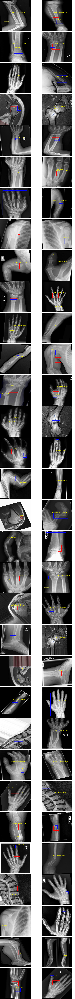

In [ ]:
predict()